# EDA

## Train set

### Dataloading

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd "/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/"

/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge


In [ ]:
!ls
%cd AICITY2024_Track4

 AICITY2024_Track4  'Module 7 - Week 2 - T4 - M07MC04 - Object Detection.mp4'
 data.zip	    'Module 7 - Week 2 - T6 - M07MC06 - Object Detection.mp4'
 model
/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4


In [ ]:
%cd dataset
!ls

/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset
fisheye8k     HIT-UAV.zip  synthetic_visdrone_fisheye8k.yaml
fisheye_test  json_labels  visdrone
hituav	      runs	   visdrone_fisheye8k.yaml


In [ ]:
%cd fisheye8k
!ls

[Errno 2] No such file or directory: 'fisheye8k'
/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye8k
test  train


In [ ]:
%cd train

/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye8k/train


In [ ]:
import pandas as pd
import json
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
with open('./train.json', 'r') as f:
    data = json.load(f)

In [ ]:
data.keys()

dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])

In [ ]:
anno = pd.json_normalize(data['annotations'])

In [ ]:
cate = pd.json_normalize(data['categories'])

In [ ]:
img_stat = pd.json_normalize(data['images'])

In [ ]:
img_stat = img_stat.sort_values('file_name')

In [ ]:
def count_cameras(df):
  camera_counts = {}
  for index, row in df.iterrows():
    file_name = row['file_name']
    parts = file_name.split('_')
    if parts and parts[0].startswith('camera'):
      camera_id = parts[0]
      if camera_id in camera_counts:
        camera_counts[camera_id] += 1
      else:
        camera_counts[camera_id] = 1
  return camera_counts

camera_counts = count_cameras(img_stat)
camera_counts

{'camera10': 500,
 'camera11': 421,
 'camera12': 30,
 'camera13': 780,
 'camera14': 498,
 'camera15': 73,
 'camera16': 50,
 'camera17': 86,
 'camera18': 33,
 'camera3': 1617,
 'camera5': 179,
 'camera6': 43,
 'camera8': 536,
 'camera9': 442}

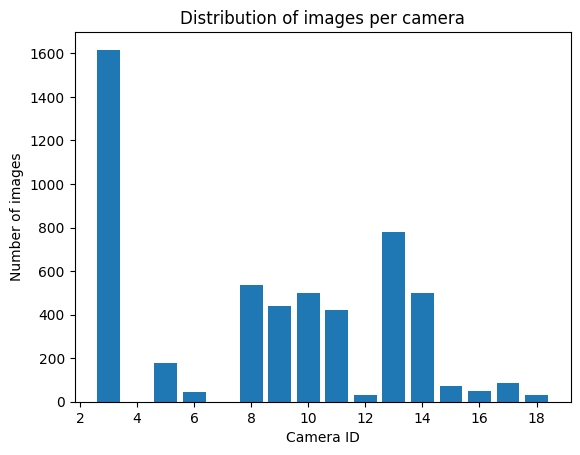

In [ ]:
# prompt: plt.bar(camera_counts.keys(), camera_counts.values()) only keep number from string of camera_counts.keys()

plt.bar([int(key.replace('camera', '')) for key in camera_counts.keys()], camera_counts.values())
plt.xlabel("Camera ID")
plt.ylabel("Number of images")
plt.title("Distribution of images per camera")
plt.show()

In [ ]:
filtered_dfs = []

for camera_name in camera_counts.keys():
    pattern = f'{camera_name}_.*_0.png'
    filtered_df = img_stat[img_stat['file_name'].str.contains(pattern, regex=True)]
    filtered_dfs.append(filtered_df)
all_filtered_data = pd.concat(filtered_dfs)
all_filtered_data['file_name']

,file_name
2074,camera10_A_0.png
3806,camera11_M_0.png
2600,camera12_A_0.png
3455,camera13_A_0.png
555,camera14_A_0.png
2976,camera15_A_0.png
3905,camera16_A_0.png
4440,camera17_A_0.png
957,camera18_A_0.png
3335,camera3_A_0.png


### Image in each camera

In [ ]:
!pwd
!ls

/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye8k/train
annotations  images  labels  train.json


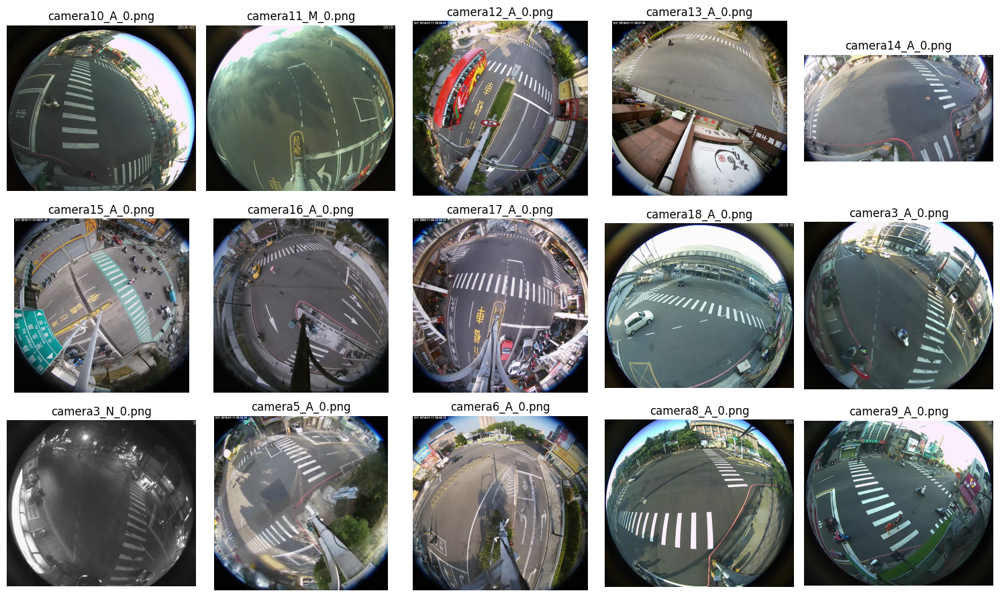

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math

num_images = len(all_filtered_data['file_name'])
cols = 5 # Number of columns in the grid
rows = math.ceil(num_images / cols) # Calculate the number of rows

plt.figure(figsize=(cols * 3, rows * 3))

for i, file_name in enumerate(all_filtered_data['file_name']):
    plt.subplot(rows, cols, i + 1)
    try:
        img = mpimg.imread(f"./images/{file_name}")
        plt.imshow(img)
        plt.title(file_name)
        plt.axis('off')
    except FileNotFoundError:
        print(f"Warning: File not found: {file_name}")
        plt.title(f"{file_name}\n(Not Found)")
        plt.axis('off')
    except Exception as e:
        print(f"Error loading image {file_name}: {e}")
        plt.title(f"{file_name}\n(Error)")
        plt.axis('off')


plt.tight_layout()
plt.show()

In [ ]:
bbox_count = anno['image_id'].value_counts().reset_index()

In [ ]:
anno['iscrowd'].value_counts()

,count
iscrowd,
0,112213


In [ ]:
cate

,id,name
0,0,Bus
1,1,Bike
2,2,Car
3,3,Pedestrian
4,4,Truck


In [ ]:
img_stat

,file_name,height,width,id
2074,camera10_A_0.png,1088,1240,1010
5136,camera10_A_1.png,1088,1240,1011
2906,camera10_A_10.png,1088,1240,10110
4735,camera10_A_100.png,1088,1240,101100
3504,camera10_A_101.png,1088,1240,101101
...,...,...,...,...
144,camera9_A_95.png,1088,1245,9195
2652,camera9_A_96.png,1088,1245,9196
2656,camera9_A_97.png,1088,1245,9197
1146,camera9_A_98.png,1088,1245,9198


### Class frequency

In [ ]:
cate_count = anno['category_id'].value_counts().reset_index()

Text(0.5, 1.0, 'Class frequency')

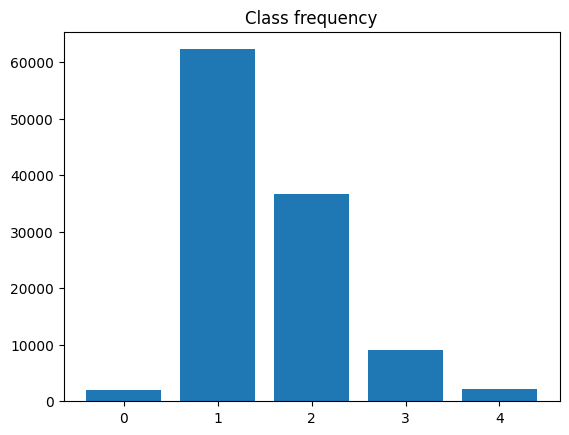

In [ ]:
plt.bar(cate_count['category_id'], cate_count['count'])
plt.title("Class frequency")

### Height and width

In [ ]:
img_stat[['height','width']].value_counts()

height  width
1088    1240     2141
1920    1920      863
1088    1245      597
        1230      578
        1920      498
        1225      200
1280    1280      199
1088    1080      179
1080    1235       33
Name: count, dtype: int64

Text(0.5, 1.0, 'Height and width of each image')

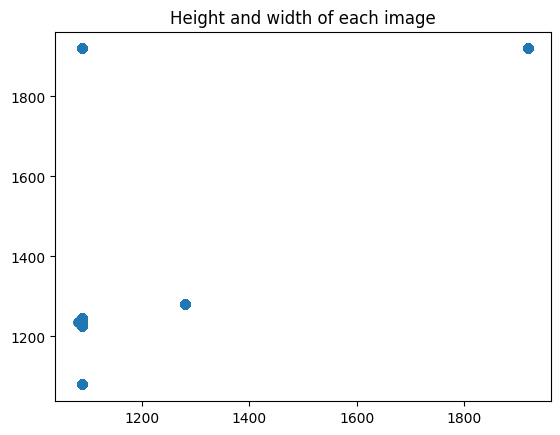

In [ ]:
plt.scatter(img_stat['height'], img_stat['width'])
plt.title('Height and width of each image')

### Amount of bouding box

In [ ]:
bbox_count['count']

,count
0,87
1,87
2,83
3,83
4,82
...,...
5283,3
5284,3
5285,3
5286,3


Text(0.5, 1.0, 'bounding box in each image')

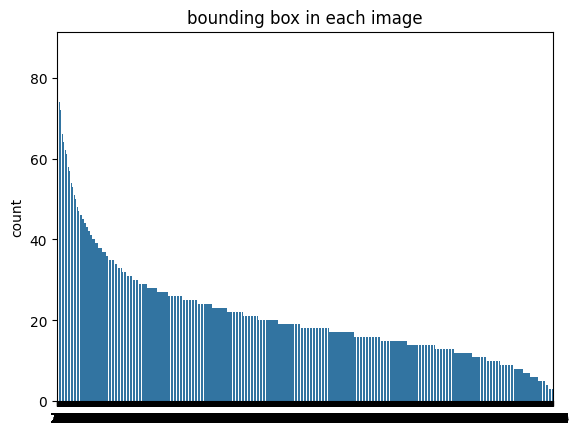

In [ ]:
sns.barplot(bbox_count['count'])
plt.title("bounding box in each image")

### Area of bounding box

In [ ]:
area_plot = anno['area'].sort_values()
area_plot

,area
63136,96
18475,96
31,100
21413,100
77265,100
...,...
16147,513710
6129,531708
1868,542916
43641,551763


In [ ]:
anno.iloc[25963]

,25963
id,25964
image_id,14144
category_id,0
bbox,"[92, 98, 1383, 616]"
area,851928
iscrowd,0


The image containing largest bouding box area is a container truck

In [ ]:
img_stat[img_stat['id'] == 14144]

,file_name,height,width,id
3579,camera14_A_44.png,1088,1920,14144


Histogram of bounding box area

Text(0.5, 1.0, 'Histogram of bounding box area')

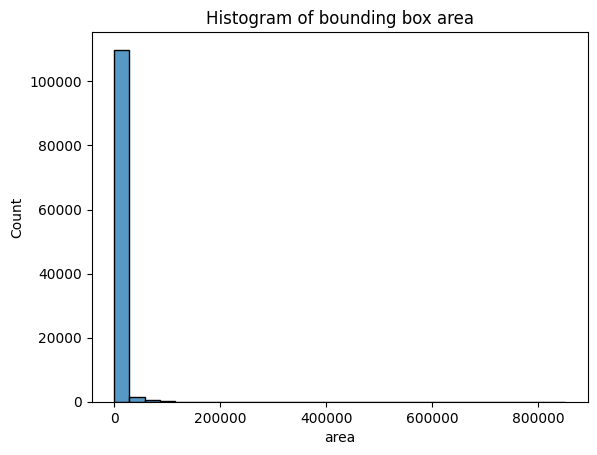

In [ ]:
sns.histplot(area_plot, bins=30)
plt.title('Histogram of bounding box area')

In [ ]:
%cd ../train

/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye8k/train


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
ls ./images/camera14_A_44.png

./images/camera14_A_44.png


In [ ]:
biggest_area = cv2.imread('./images/camera14_A_44.png')

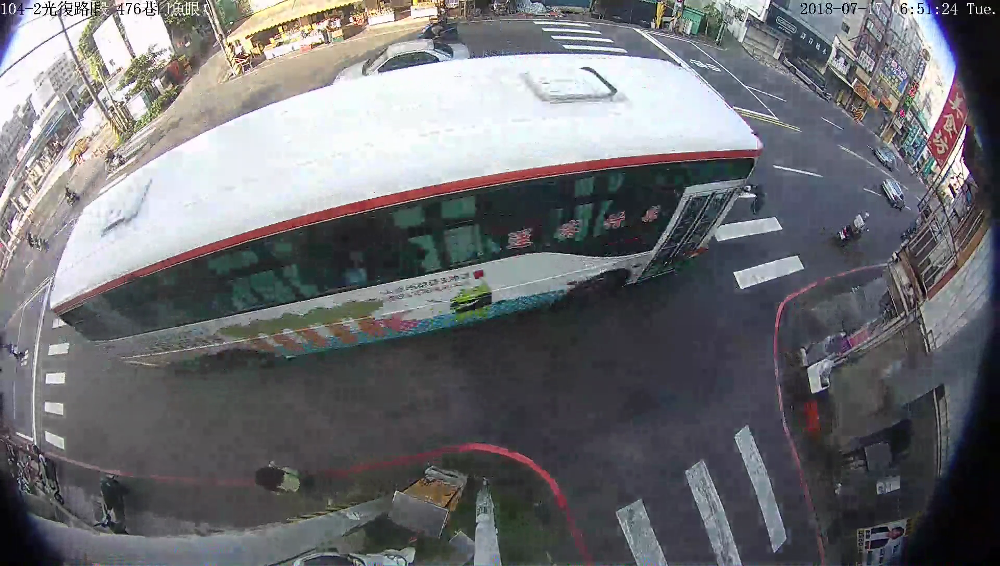

In [ ]:
cv2_imshow(biggest_area)

## Test set

### Data loading

In [ ]:
%cd ../test/

/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye8k/test


In [ ]:
with open('test.json', 'r') as f:
    data = json.load(f)

In [ ]:
data.keys()

dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])

In [ ]:
cate1 = pd.json_normalize(data['categories'])
# cate1

In [ ]:
img_stat1 = pd.json_normalize(data['images'])
img_stat1

,file_name,height,width,id
0,camera2_A_167.png,1088,1085,21167
1,camera4_N_60.png,1088,1230,4360
2,camera1_A_50.png,1088,1245,1150
3,camera4_E_97.png,1088,1230,4297
4,camera4_M_348.png,1088,1230,40348
...,...,...,...,...
2707,camera4_N_175.png,1088,1230,43175
2708,camera7_A_464.png,1088,1225,71464
2709,camera2_A_239.png,1088,1085,21239
2710,camera4_N_507.png,1088,1230,43507


In [ ]:
anno1 = pd.json_normalize(data['annotations'])
anno1

,id,image_id,category_id,bbox,area,iscrowd
0,1,11319,1,"[169, 371, 31, 22]",682,0
1,2,11319,1,"[164, 382, 32, 25]",800,0
2,3,11319,1,"[157, 400, 28, 24]",672,0
3,4,11319,1,"[149, 414, 27, 23]",621,0
4,5,11319,1,"[140, 430, 34, 23]",782,0
...,...,...,...,...,...,...
45140,45141,71447,2,"[302, 219, 29, 17]",493,0
45141,45142,71447,1,"[469, 204, 15, 17]",255,0
45142,45143,71447,1,"[804, 289, 20, 22]",440,0
45143,45144,71447,1,"[1041, 493, 25, 25]",625,0


In [ ]:
anno1['iscrowd'].value_counts()

,count
iscrowd,
0,45145


In [ ]:
cate

,id,name
0,0,Bus
1,1,Bike
2,2,Car
3,3,Pedestrian
4,4,Truck


### Class frequency

In [ ]:
cate_count1 = anno1['category_id'].value_counts().reset_index()
cate_count1

,category_id,count
0,1,26270
1,2,14113
2,3,2633
3,4,1199
4,0,930


Text(0.5, 1.0, 'Class frequency')

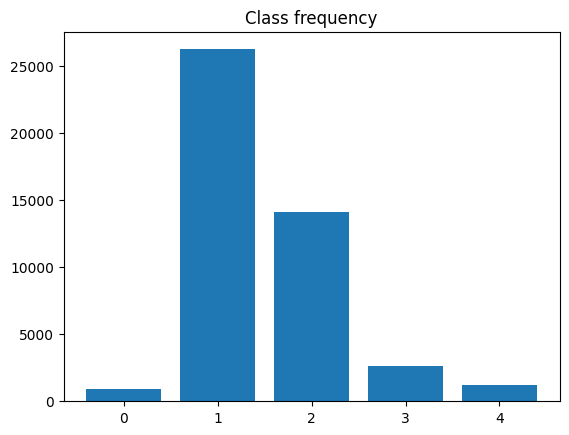

In [ ]:
plt.bar(cate_count1['category_id'], cate_count1['count'])
plt.title('Class frequency')

### Height and width

In [ ]:
img_stat1[['height','width']].value_counts()

height  width
1088    1230     1518
        1225      494
        1245      400
        1085      300
Name: count, dtype: int64

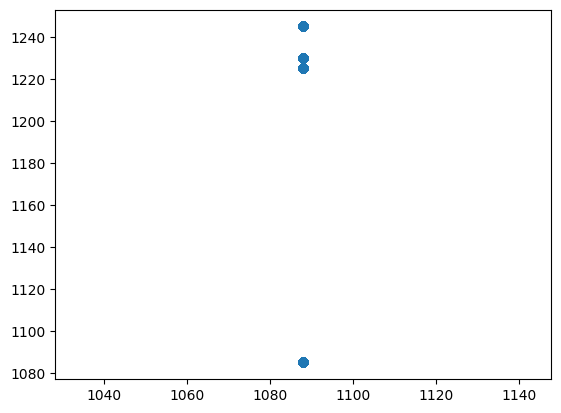

In [ ]:
plt.scatter(img_stat1['height'], img_stat1['width'])

### Amount of bounding box

In [ ]:
anno1['image_id'].value_counts()

,count
image_id,
40109,64
11338,62
11336,61
11337,60
11332,60
...,...
43378,3
43364,3
2177,3


In [ ]:
bbox_count1 = anno1['image_id'].value_counts().sort_values().reset_index()
bbox_count1['count']

,count
0,2
1,3
2,3
3,3
4,3
...,...
2707,60
2708,60
2709,61
2710,62


<Axes: ylabel='count'>

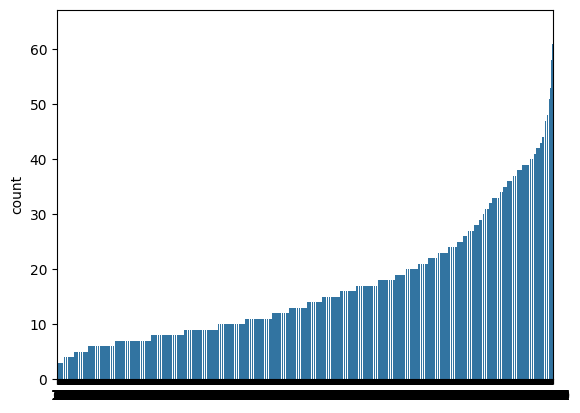

In [ ]:
sns.barplot(bbox_count1['count'])

### Area of bouding box

In [ ]:
area_plo1t = anno1['area'].sort_values()
area_plo1t

,area
10723,100
8250,100
30641,100
30642,100
17101,100
...,...
17580,318000
14493,322828
42112,359964
32655,463888


<Axes: xlabel='area', ylabel='Count'>

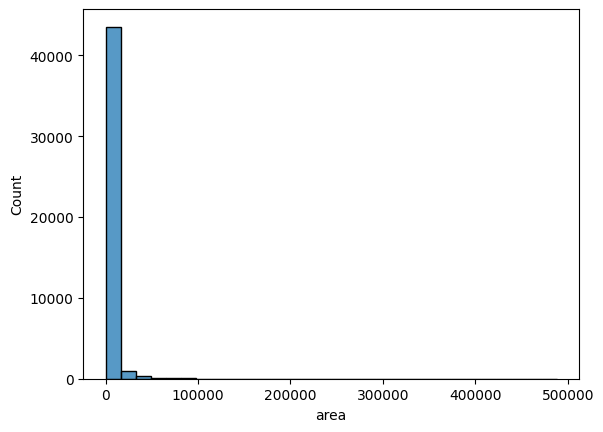

In [ ]:
sns.histplot(area_plo1t, bins=30)

In [ ]:
camera_counts1 = count_cameras(img_stat1)
camera_counts1.keys()

dict_keys(['camera2', 'camera4', 'camera1', 'camera7'])

In [ ]:
filtered_dfs1 = []

for camera_name in camera_counts1.keys():
    pattern = f'{camera_name}_.*_0.png'
    filtered_df1 = img_stat1[img_stat1['file_name'].str.contains(pattern, regex=True)]
    filtered_dfs1.append(filtered_df1)
all_filtered_data1 = pd.concat(filtered_dfs1)
all_filtered_data1['file_name']

,file_name
2397,camera2_A_0.png
976,camera4_E_0.png
1381,camera4_M_0.png
1778,camera4_N_0.png
2302,camera4_A_0.png
2054,camera1_A_0.png
2540,camera7_A_0.png


### Image in each camera

In [ ]:
def count_cameras(df):
  camera_counts = {}
  for index, row in df.iterrows():
    file_name = row['file_name']
    parts = file_name.split('_')
    if parts and parts[0].startswith('camera'):
      camera_id = parts[0]
      if camera_id in camera_counts:
        camera_counts[camera_id] += 1
      else:
        camera_counts[camera_id] = 1
  return camera_counts

camera_counts1 = count_cameras(img_stat1)
camera_counts1

{'camera2': 300, 'camera4': 1518, 'camera1': 400, 'camera7': 494}

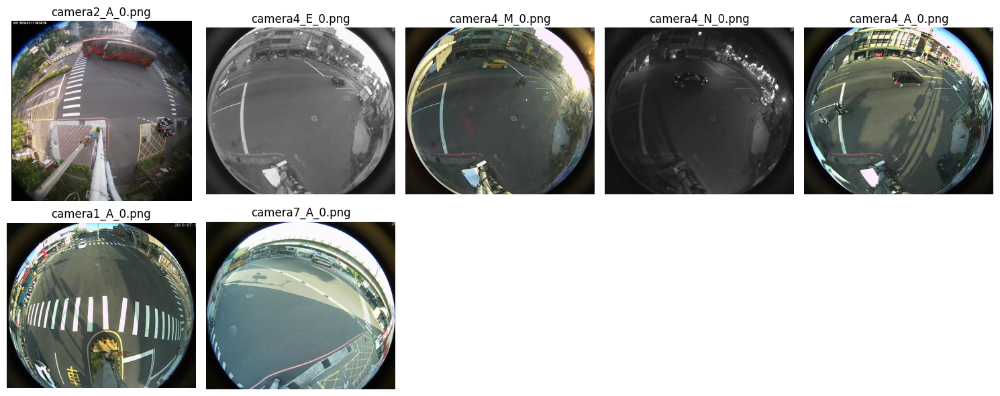

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math

num_images = len(all_filtered_data['file_name'])
cols = 5 # Number of columns in the grid
rows = math.ceil(num_images / cols) # Calculate the number of rows

plt.figure(figsize=(cols * 3, rows * 3))

for i, file_name in enumerate(all_filtered_data1['file_name']):
    plt.subplot(rows, cols, i + 1)
    try:
        img = mpimg.imread(f"./images/{file_name}")
        plt.imshow(img)
        plt.title(file_name)
        plt.axis('off')
    except FileNotFoundError:
        print(f"Warning: File not found: {file_name}")
        plt.title(f"{file_name}\n(Not Found)")
        plt.axis('off')
    except Exception as e:
        print(f"Error loading image {file_name}: {e}")
        plt.title(f"{file_name}\n(Error)")
        plt.axis('off')


plt.tight_layout()
plt.show()

# Model training

In [ ]:
!ls

 AICITY2024_Track4  'Module 7 - Week 2 - T4 - M07MC04 - Object Detection.mp4'
 data.zip	    'Module 7 - Week 2 - T6 - M07MC06 - Object Detection.mp4'
 model		     SO_DETR


In [ ]:
!pip install -U ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 26.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 117.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 85.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 63.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 83.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [ ]:
%cd SO_DETR

/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/SO_DETR


In [ ]:
!cat train_exp.py

import warnings
import os
from pathlib import Path
from ultralytics import RTDETR
import torch

warnings.filterwarnings('ignore')


def check_path(path):
    if not os.path.exists(path):
        raise FileNotFoundError(f"Path does not exist: {path}")


if __name__ == '__main__':
    torch.cuda.empty_cache()
    # 获取当前脚本所在的目录
    current_dir = Path(__file__).parent
    # 构建相对路径
    yaml_path = '/mnt/RTdetr/RTDETR-main/dataset/dataset_visdrone/data.yaml'
    # yaml_path = '/mnt/RTdetr/RTDETR-main/dataset/vaste/data.yaml'
    check_path(yaml_path)
    model = RTDETR('/mnt/RTdetr/SO_DETR/ultralytics/cfg/models/A-Test-M-R18.yaml')
    # model = RTDETR('/mnt/RTdetr/RTDETR-main/ultralytics/cfg/models/rt-detr/A-Test-M-EV2.yaml')
    model.train(data=str(yaml_path),
                cache=False,
                imgsz=640,
                epochs=350,
                batch=4,
                workers=24,
                device='0',
                # resume='', # last.pt path
                project

In [ ]:
train_exp = """
import warnings
import os
from pathlib import Path
from ultralytics import RTDETR
import torch

warnings.filterwarnings('ignore')


def check_path(path):
    if not os.path.exists(path):
        raise FileNotFoundError(f"Path does not exist: {path}")


if __name__ == '__main__':
    torch.cuda.empty_cache()
    # 获取当前脚本所在的目录
    current_dir = Path(__file__).parent
    # 构建相对路径
    yaml_path = '/mnt/RTdetr/RTDETR-main/dataset/dataset_visdrone/data.yaml'
    # yaml_path = '/mnt/RTdetr/RTDETR-main/dataset/vaste/data.yaml'
    check_path(yaml_path)
    model = RTDETR('/mnt/RTdetr/SO_DETR/ultralytics/cfg/models/A-Test-M-R18.yaml')
    # model = RTDETR('/mnt/RTdetr/RTDETR-main/ultralytics/cfg/models/rt-detr/A-Test-M-EV2.yaml')
    model.train(data=str(yaml_path),
                cache=False,
                imgsz=640,
                epochs=350,
                batch=4,
                workers=24,
                device='0',
                # resume='', # last.pt path
                project='runs/train/A',
                name='exp_so_R18',
                patience = 40,
                )
    print('/mnt/RTdetr/RTDETR-main/ultralytics/cfg/models/rt-detr/exp_so_r18.yaml')
  """

In [ ]:
with open("/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/SO_DETR/train_exp.py")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
!git clone https://github.com/ValiantDiligent/SO_DETR

Cloning into 'SO_DETR'...
remote: Enumerating objects: 464, done.
remote: Counting objects: 100% (464/464), done.
remote: Compressing objects: 100% (320/320), done.
remote: Total 464 (delta 135), reused 464 (delta 135), pack-reused 0 (from 0)
Receiving objects: 100% (464/464), 905.43 KiB | 5.80 MiB/s, done.
Resolving deltas: 100% (135/135), done.
Updating files: 100% (245/245), done.


In [ ]:
from ultralytics import RTDETR

ModuleNotFoundError: No module named 'cv2'

In [ ]:
yaml_content = """
train: [
  "/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye8k/train",
  "/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/hituav",
]

val: [
  "/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye8k/test",
]
test: [
    "/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye_test"
]

# number of classes
nc: 5

# class names
names: [
  "bus",
  "bike",
  "car",
  "pedestrian",
  "truck",
]
"""

with open("/content/fisheye8k.yaml", "w") as file:
    file.write(yaml_content)

In [ ]:
test_results = model.val(data="/content/fisheye8k.yaml", imgsz=1280, device=[0])

Ultralytics 8.3.145 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
rt-detr-x summary: 373 layers, 65,477,711 parameters, 0 gradients, 222.5 GFLOPs
val: Fast image access ✅ (ping: 0.6±0.1 ms, read: 221.5±121.2 MB/s, size: 1699.7 KB)


val: Scanning /content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye8k/test/labels... 2712 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2712/2712 [29:01<00:00,  1.56it/s]


val: New cache created: /content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye8k/test/labels.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 170/170 [10:13<00:00,  3.61s/it]


                   all       2712      45145      0.726      0.548       0.63       0.38
                   bus        695        930      0.711      0.717      0.723      0.492
                  bike       2696      26270      0.744      0.567      0.667      0.305
                   car       2606      14113      0.826      0.672       0.77      0.485
            pedestrian       1154       2633      0.503      0.358      0.375      0.177
                 truck       1125       1199      0.845      0.427      0.615       0.44
Speed: 1.3ms preprocess, 217.8ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/val2


In [ ]:
test_results.confusion_matrix

Error: Could not read the image file at /content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/model/runs/val/exp/confusion_matrix.png. Please check the path.


In [ ]:
!git clone https://github.com/vnptai/AICITY2024_Track4

Cloning into 'AICITY2024_Track4'...
remote: Enumerating objects: 3461, done.
remote: Counting objects: 100% (35/35), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 3461 (delta 8), reused 6 (delta 6), pack-reused 3426 (from 1)
Receiving objects: 100% (3461/3461), 29.82 MiB | 15.05 MiB/s, done.
Resolving deltas: 100% (1304/1304), done.
Updating files: 100% (5672/5672), done.
Filtering content: 100% (19/19), 1.00 GiB | 38.76 MiB/s, done.
Encountered 16 file(s) that should have been pointers, but weren't:
	infer/InternImage/autonomous_driving/openlane-v2/data/OpenLane-V2/data_dict_sample.json
	infer/InternImage/autonomous_driving/openlane-v2/data/OpenLane-V2/data_dict_subset_A.json
	infer/InternImage/classification/configs/accelerate/deepspeed/ds_config_zero1.json
	infer/InternImage/classification/configs/accelerate/deepspeed/ds_config_zero1_wo_loss_scale.json
	infer/InternImage/classification/configs/accelerate/deepspeed/ds_config_zero3_offload.json
	infer/InternImag

In [ ]:
%cd "/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4"

[Errno 2] No such file or directory: '/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4'
/content


In [ ]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 59.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
INFO: pip is looking at multiple versions of opencv-python to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of opencv-python to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.8/89.8 MB 8.6 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × pip subprocess to install build dependencies did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Installing build dependencies ... error
error: subprocess-exited-with-error

× pip subprocess to install build dependencies did not run successfull

In [ ]:
!pip install opencv-python

In [ ]:
!python ./dataprocessing/format_conversion/visdrone2yolo.py --data_path ./dataset/visdrone/VisDrone2019-DET-train

  4% 229/6471 [05:45<2:38:10,  1.52s/it]

In [ ]:
# Fisheye Conversion
!python ./dataprocessing/ifish_augmentation/convert_visdrone.py --src_path ./dataset/visdrone --trg_path ./dataset/synthetic_visdrone --distortion 0.5 --data_type VisDrone2019-DET-train --crop True

# Visualize 4 images for checking
!python ./dataprocessing/visualization/visualization.py --image_dir ./dataset/synthetic_visdrone/VisDrone2019-DET-train/images --label_dir ./dataset/synthetic_visdrone/VisDrone2019-DET-train/labels --num_imgs 4 --save_dir ./dataprocessing/visualization

In [ ]:
# Convert VisDrone dataset
!python ./dataprocessing/format_conversion/yolo2coco.py --images_dir ./dataset/visdrone/VisDrone2019-DET-train/images --labels_dir ./dataset/visdrone/VisDrone2019-DET-train/labels --output ./dataset/visdrone/train.json

# Convert Synthetic VisDrone dataset
!python ./dataprocessing/format_conversion/yolo2coco.py --images_dir ./dataset/synthetic_visdrone/VisDrone2019-DET-train/images --labels_dir ./dataset/synthetic_visdrone/VisDrone2019-DET-train/labels --output ./dataset/synthetic_visdrone/train.json

In [ ]:
torch.device

torch.device

In [ ]:
!wget -O HIT-UAV.zip https://zenodo.org/records/7633134/files/suojiashun/HIT-UAV-Infrared-Thermal-Dataset-v1.2.1.zip?download=1

--2025-05-24 13:02:31--  https://zenodo.org/records/7633134/files/suojiashun/HIT-UAV-Infrared-Thermal-Dataset-v1.2.1.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.185.48.194, 188.185.43.25, 188.185.45.92, ...
Connecting to zenodo.org (zenodo.org)|188.185.48.194|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 814751578 (777M) [application/octet-stream]
Saving to: ‘HIT-UAV.zip’

HIT-UAV.zip         100%[===================>] 777.01M  28.8MB/s    in 31s     

2025-05-24 13:03:02 (25.4 MB/s) - ‘HIT-UAV.zip’ saved [814751578/814751578]



In [ ]:
!pwd

/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset


# Inference

In [ ]:
!pip uninstall onnxruntime
!pip install onnxruntime-gpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 283.2/283.2 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 9.1 MB/s eta 0:00:00


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 17.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 103.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 77.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 49.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 83.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [ ]:
from ultralytics import RTDETR
from PIL import Image

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## ONNX

In [ ]:
model = RTDETR('/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/model/rtdetr_best.onnx')

In [ ]:
%cd "/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye_test/images"

/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye_test/images


In [ ]:
!ls

drive  sample_data


In [ ]:
!ls

camera24_A_21.png  camera26_A_0.png   camera27_A_65.png  camera29_A_46.png
camera24_A_22.png  camera26_A_10.png  camera27_A_66.png  camera29_A_47.png
camera24_A_23.png  camera26_A_11.png  camera27_A_67.png  camera29_A_48.png
camera24_A_24.png  camera26_A_12.png  camera27_A_68.png  camera29_A_49.png
camera24_A_25.png  camera26_A_13.png  camera27_A_69.png  camera29_A_4.png
camera24_A_26.png  camera26_A_14.png  camera27_A_6.png	 camera29_A_50.png
camera24_A_27.png  camera26_A_15.png  camera27_A_70.png  camera29_A_51.png
camera24_A_28.png  camera26_A_16.png  camera27_A_71.png  camera29_A_52.png
camera24_A_29.png  camera26_A_17.png  camera27_A_72.png  camera29_A_53.png
camera24_A_30.png  camera26_A_18.png  camera27_A_73.png  camera29_A_54.png
camera24_A_31.png  camera26_A_19.png  camera27_A_74.png  camera29_A_55.png
camera24_A_32.png  camera26_A_1.png   camera27_A_75.png  camera29_A_56.png
camera24_A_33.png  camera26_A_20.png  camera27_A_76.png  camera29_A_57.png
camera24_A_34.png  camera26

In [ ]:
res = model("./", conf=0.45, iou=0.45)

RuntimeError: Error in execution: Got invalid dimensions for input: images for the following indices
 index: 2 Got: 640 Expected: 1280
 index: 3 Got: 640 Expected: 1280
 Please fix either the inputs/outputs or the model.

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
img = cv2.imread('camera26_A_6.png')

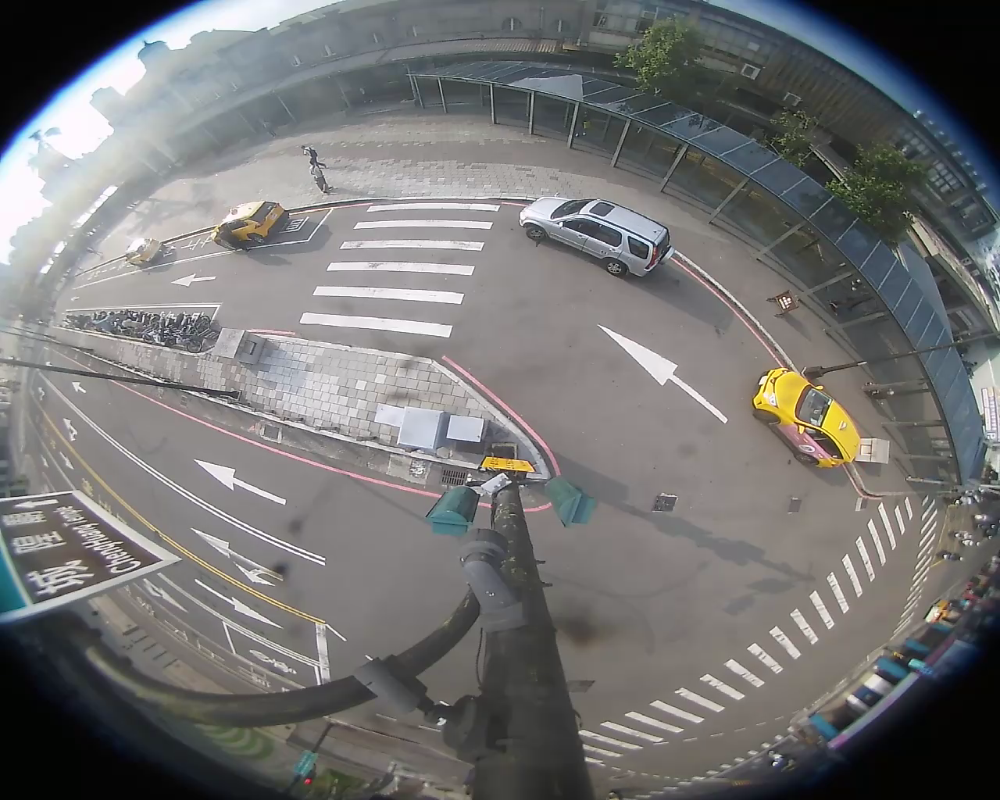

In [ ]:
cv2_imshow(img)

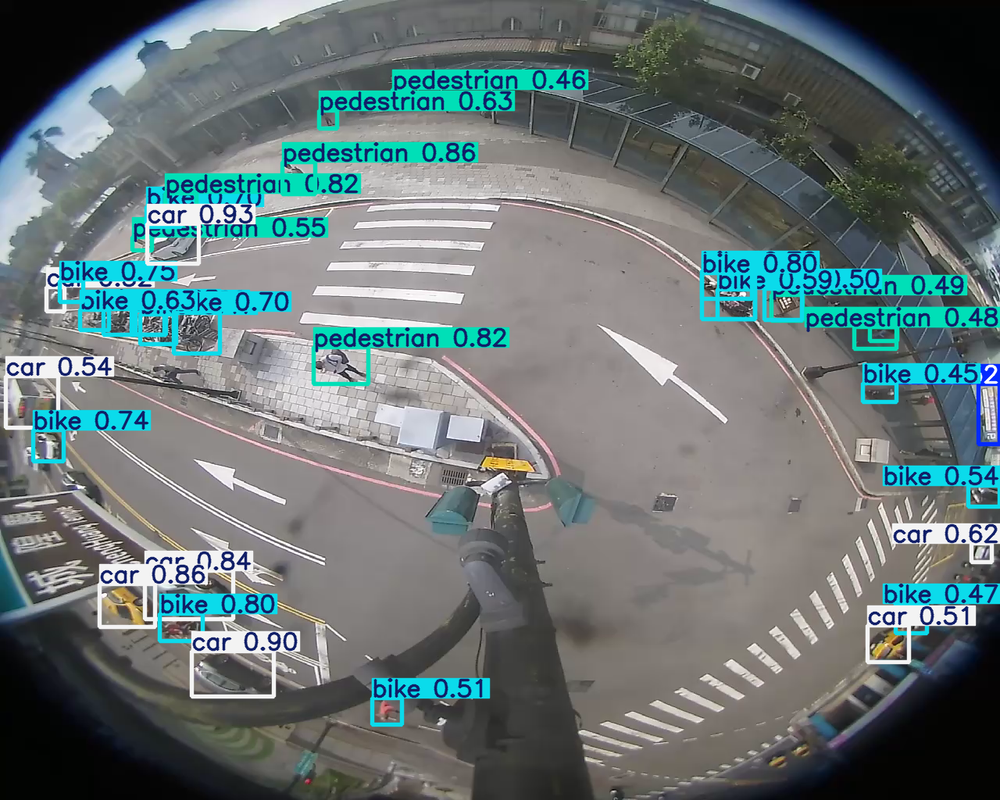

In [ ]:
res[200].show()

## Pytorch

In [ ]:
model = RTDETR('/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/model/rtdetr.pt')

In [ ]:
%cd "/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye_test/images

/content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye_test/images
camera24_A_21.png  camera26_A_0.png   camera27_A_65.png  camera29_A_46.png
camera24_A_22.png  camera26_A_10.png  camera27_A_66.png  camera29_A_47.png
camera24_A_23.png  camera26_A_11.png  camera27_A_67.png  camera29_A_48.png
camera24_A_24.png  camera26_A_12.png  camera27_A_68.png  camera29_A_49.png
camera24_A_25.png  camera26_A_13.png  camera27_A_69.png  camera29_A_4.png
camera24_A_26.png  camera26_A_14.png  camera27_A_6.png	 camera29_A_50.png
camera24_A_27.png  camera26_A_15.png  camera27_A_70.png  camera29_A_51.png
camera24_A_28.png  camera26_A_16.png  camera27_A_71.png  camera29_A_52.png
camera24_A_29.png  camera26_A_17.png  camera27_A_72.png  camera29_A_53.png
camera24_A_30.png  camera26_A_18.png  camera27_A_73.png  camera29_A_54.png
camera24_A_31.png  camera26_A_19.png  camera27_A_74.png  camera29_A_55.png
camera24_A_32.png  camera26_A_1.png   camera27_A_75.png  camera29_A_56.png

In [ ]:
%cd ..

In [ ]:
res = model('./', conf=0.45 )


image 1/569 /content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye_test/images/camera24_A_21.png: 1280x1280 4 bikes, 6 cars, 2 pedestrians, 19941.4ms
image 2/569 /content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye_test/images/camera24_A_22.png: 1280x1280 10 bikes, 6 cars, 17220.1ms
image 3/569 /content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye_test/images/camera24_A_23.png: 1280x1280 14 bikes, 5 cars, 1 pedestrian, 17916.7ms
image 4/569 /content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye_test/images/camera24_A_24.png: 1280x1280 8 bikes, 7 cars, 16848.2ms
image 5/569 /content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye_test/images/camera24_A_25.png: 1280x1280 5 bikes, 4 cars, 18001.7ms
image 6/569 /content/drive/MyDrive/Colab Notebooks/AI_City_Challenge/AICITY2024_Track4/dataset/fisheye_test/image